In [1]:
import datetime
import time
import sys
import glob

sys.path.append('..')
sys.path.append('../src')

# --- Dependencies
import pygmo as pg
import numpy as np
import pandas as pd
import sobol_seq

# import dovpanda

import plotly
from plotly import graph_objs as go
from plotly import tools
import plotly.express as px

import sklearn.gaussian_process as gp
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression

from src.composite import PredictTutor, ModelsUnion
from src.generator import SamplesGenerator
from src.ploting import plot_mo

from src.hypothesis.tpot_estimator import TpotWrp
from src.hypothesis.custom_gp_kernel import KERNEL_MAUNA, KERNEL_SIMPLE, KERNEL_GPML

def sobol_sample(bounds=([0., 0.], [5., 5.]), n=1):
    """ Sobol sampling

    Args:
        bounds (Tuple):  Tuple with lower and higher bound for each feature in objective space.
        Example: (([0., 0.]), ([2., 4.]))
        n (int, optional): Sample count. Defaults to 1.

    Returns:
        List: 2D list of point(s) from search space
    """
    n_dim = len(bounds[0])
    sb = sobol_seq.i4_sobol_generate(n_dim, n, 1)
    diff = [r-l for l, r in zip(*bounds)]
    left = [l for l, _ in zip(*bounds)]
    return (sb*diff+left).tolist()

# fig = px.scatter(X_ndf, x="f1", y="f2", color='ndf', template="presentation")
# df = pd.DataFrame({
#     'x':[1,2,3,4],
#     'y':[5,6,7,8],})
# fig2 = px.scatter(edf, x="f1", y="f2", template="presentation")
# fig.add_trace(fig2.data[0])
# fig.show()

def lh_sample(bounds, n=1):
    """ Latin Hypercube sampling

    Args:
        bounds (Tuple):  Tuple with lower and higher bound for each feature in objective space.
        Example: (([0., 0.]), ([2., 4.]))
        n (int, optional): Sample count. Defaults to 1.

    Returns:
        List: Point from search space
    """
    n_dim = len(bounds[0])
    h_cube = np.random.uniform(size=[n, n_dim])
    for i in range(0, n_dim):
        h_cube[:, i] = (np.argsort(h_cube[:, i])+0.5)/n
    diff = [r-l for l, r in zip(*bounds)]
    left = [l for l, _ in zip(*bounds)]
    return h_cube*diff+left

In [2]:
np.count_nonzero(pd.read_csv('./data/hypermapper/WFG8_xximzap_output_samples.csv').Timestamp < 2000)

100

In [13]:
DIM = 2
# ID = 1
OBJ = 2

# --- Problem
# udp = pg.wfg(prob_id=ID, dim_dvs=DIM, dim_obj=OBJ, dim_k=OBJ-1)
for ID in [1,2,3,4,6]:
#     udp = pg.wfg(prob_id=ID, dim_dvs=DIM, dim_obj=OBJ, dim_k=OBJ-1)
    udp = pg.zdt(prob_id=ID, param=DIM)
    pro = pg.problem(udp)

    pop = pg.population(pro, size=100)
    algo1 = pg.algorithm(pg.moead(gen=500))
    algo2 = pg.algorithm(pg.nsga2(gen=500))
    epop = algo1.evolve(pop) 
    epop = algo2.evolve(epop) 

    fig = plot_mo(pro)
    # fig.write_image('./img/prob_{}.png'.format(pro.get_name()), width=1600)
    # plot_mo(pro, pop)
    fig = plot_mo(pro, epop)
    fig.write_image('./img/prob_{}.png'.format(pro.get_name()), width=1600)
# fig

In [5]:
udp = pg.zdt(prob_id=4, param=2)
pro = pg.problem(udp)
fig = plot_mo(pro, samples=400)
fig.write_image('./img/prob_large_{}.svg'.format(pro.get_name()), width=1600)

In [4]:
# pop = pg.population(pro, size=10)
# df = pd.DataFrame(pop.get_f(), columns=['f1', 'f2'])
# # edf = pd.DataFrame(epop.get_f(), columns=['f1', 'f2'])

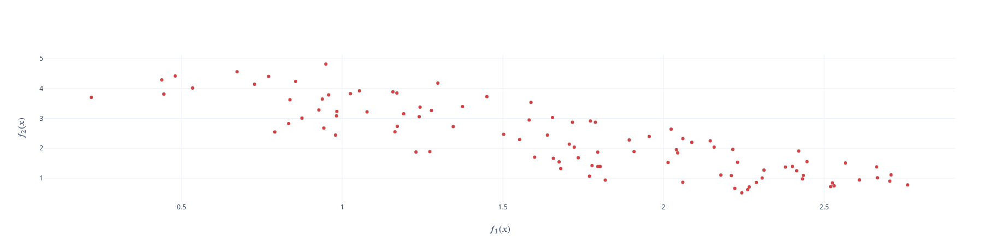

In [64]:
DIM = 3
ID = 3
OBJ = 2

# --- Problem
udp = pg.wfg(prob_id=ID, dim_dvs=DIM, dim_obj=OBJ, dim_k=OBJ-1)
# udp = pg.zdt(prob_id=ID, param=DIM)
pro = pg.problem(udp)

pop = pg.population(pro, size=100, seed=72)
df = pd.DataFrame(pop.get_f(), columns=['f1', 'f2'])

# Evolve 
pop = pg.population(pro, size=100)
algo1 = pg.algorithm(pg.moead(gen=500))
algo2 = pg.algorithm(pg.nsga2(gen=500))
epop = algo1.evolve(pop) 
epop = algo2.evolve(epop) 

edf = pd.DataFrame(epop.get_f(), columns=['f1', 'f2'])
edf.sort_values(by=['f1', 'f2'], ascending=False, inplace=True)
# -----------------------------------

ndf, dl, dc, ndr = pg.fast_non_dominated_sorting(pop.get_f())

fig = go.Figure()
fig.update_layout(template='plotly_white',
#                       title="$x^2 \frac{d^2 y}{dx^2} + x \frac{dy}{dx} + (x^2 - \nu^2)y = 0$",
                    xaxis_title="$f_1(x)$",
                    yaxis_title="$f_2(x)$",)
fig.add_trace(go.Scatter(x=df.f1.values, y=df.f2.values,
#                          marker_color='rgb(224,224,224)',
                         marker_color='#cf4446',
                    mode='markers'))
# fig.add_trace(go.Scatter(x=edf.f1.values, y=edf.f2.values,
# #                          marker_color='rgb(178,24,43)',
# #                          marker_color='rgb(11,102,189)',
#                     mode='lines'))
# fig.add_trace(go.Scatter(x=edf.f1.values, y=edf.f2.values,
#                          marker_color='rgb(178,24,43)',
# #                          marker_color='rgb(11,102,189)',
#                     mode='markers'))

fig.show()

In [65]:
fig.write_image("./presentation/init_100_big.png", width=500, height=500)

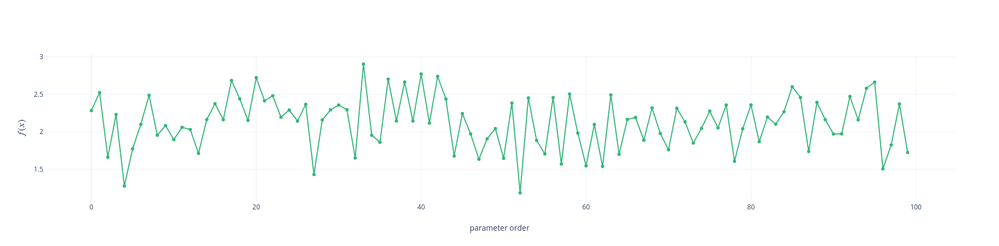

In [26]:
scal_pro = pg.problem(pg.decompose(prob=pro))

pop = pg.population(scal_pro, size=100)
df = pd.DataFrame(pop.get_f(), columns=['ff'])


pop = pg.population(scal_pro, size=1)
algo = pg.algorithm(pg.simulated_annealing(Ts=10., Tf=1e-5, n_T_adj = 100))
epop = algo.evolve(pop) 

edf = pd.DataFrame(epop.get_f(), columns=['ff'])
# -----------------------------------

fig = go.Figure()
fig.update_layout(template='plotly_white',
#                       title="$x^2 \frac{d^2 y}{dx^2} + x \frac{dy}{dx} + (x^2 - \nu^2)y = 0$",
                    xaxis_title="parameter order",
                    yaxis_title="$f(x)$",)
fig.add_trace(go.Scatter(x=df.index.values, y=df.ff.values,
                         marker_color='#35b779',
#                          marker_color='#cf4446',
                    mode='markers+lines'))
# fig.add_trace(go.Scatter(x=edf.f1.values, y=edf.f2.values,
# #                          marker_color='rgb(178,24,43)',
# #                          marker_color='rgb(11,102,189)',
#                     mode='lines'))
# fig.add_trace(go.Scatter(x=edf.f1.values, y=edf.f2.values,
# #                          marker_color='rgb(178,24,43)',
#                          marker_color='rgb(11,102,189)',
#                     mode='markers'))

fig.show()

In [61]:
fig.write_image("./presentation/pareto_front_points_2.png", width=900, height=900)
# fig.write_image("./presentation/pareto_example_0.svg", width=900, height=900)

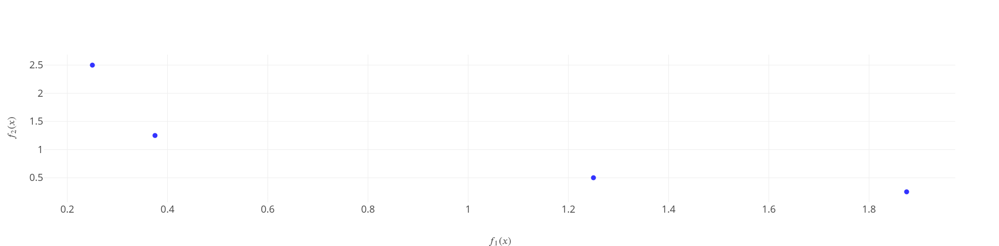

In [6]:
V = sobol_sample(pro.get_bounds(), n=10)
ndf, dl, dc, ndr = pg.fast_non_dominated_sorting(V)

fig = go.Figure()
fig.update_layout(template='presentation',
#                       title="$x^2 \frac{d^2 y}{dx^2} + x \frac{dy}{dx} + (x^2 - \nu^2)y = 0$",
                    xaxis_title="$f_1(x)$",
                    yaxis_title="$f_2(x)$",)
# fig.add_trace(go.Scatter(x=sobol_df.f1.values, y=sobol_df.f2.values,
#                     marker_color='rgba(85,85,85,0.6)',
#                     mode='markers',
#                     name='Dominated'))
fig.add_trace(go.Scatter(x=np.array(V)[ndf[0]][:,0], y=np.array(V)[ndf[0]][:,1],
                         marker_color='rgba(51,51,255,1)',
                    mode='markers',
                    name='Non-dominated'))
# fig.add_trace(go.Scatter(x=edf.f1.values/4, y=edf.f2.values/4,
#                          marker_color='rgba(204,51,0,1)',
#                     mode='markers',
#                     name='Pareto-front'))

fig.show()

In [7]:
# fig.to_image(format="pdf", width=600, height=350, scale=2)
# fig.write_image("./hypervolume.svg", width=600, height=500)

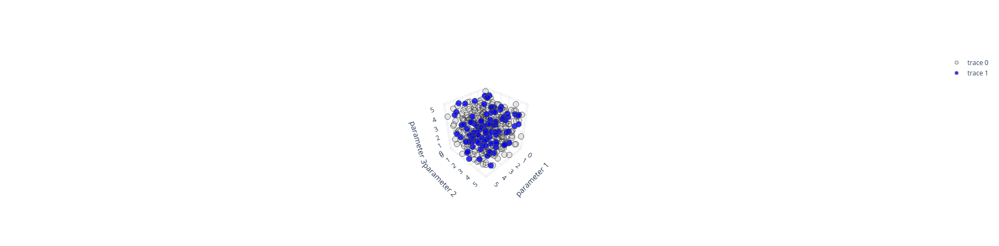

In [62]:
t = np.linspace(0, 10, 50)
x, y, z = np.cos(t), np.sin(t), t

V = sobol_sample(([0,0,0],[5,5,5]), n=300)
sobol_df = pd.DataFrame(V, columns=['p1', 'p2', 'p3'])


lth = lh_sample(([0,0,0],[5,5,5]), n=100)
df_final = pd.DataFrame(lth, columns=['p1', 'p2', 'p3'])


# xvalues = np.linspace(0, 5, num=10)
# yvalues = np.linspace(0, 5, num=10)
# zvalues = np.linspace(0, 5, num=10)
# xx, yy, zz = np.meshgrid(xvalues, yvalues, zvalues)

fig = go.Figure()
fig.update_layout(
                template='plotly_white',
                height=800,
                scene = dict(
                xaxis = dict(
                    title='parameter 1'),
                yaxis = dict(
                    title='parameter 2'),
                zaxis = dict(
                    title='parameter 3'),),
                
                )
scat1 = go.Scatter3d(x=sobol_df.p1.values, 
                     y=sobol_df.p2.values, 
                     z=sobol_df.p3.values,
                    marker=dict(
                        size=6,
                        color="rgb(224,224,224)",
                        line=dict(
#                             color='rgba(152, 0, 0, 1)',
                            width=0.9
                        ),
                        opacity=0.8
                    ),
                     mode='markers')


scat2 = go.Scatter3d(x=df_final.p1.values, 
                     y=df_final.p2.values, 
                     z=df_final.p3.values,
                    marker=dict(
                        size=6,
                        color="blue",
                        line=dict(
#                             color='rgba(152, 0, 0, 1)',
                            width=0.9
                        ),
                        opacity=0.8
                    ),
                     mode='markers')

# scat2 = go.Scatter3d(x=x, y=y, z=z, mode='markers')

fig.add_trace(scat1)
fig.add_trace(scat2)
fig.show()

In [63]:
fig.write_image("./presentation/final_100_param.png", width=800, height=800)

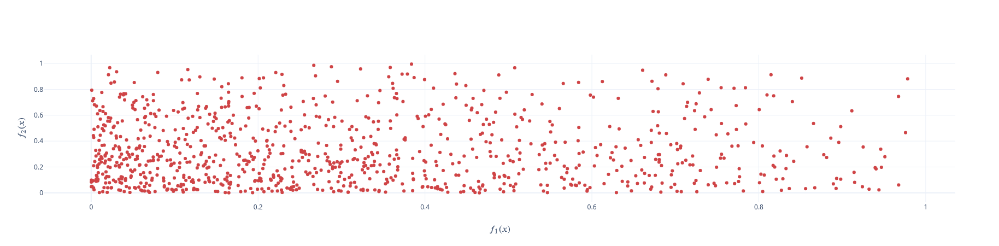

In [44]:
import plotly.graph_objects as go
import numpy as np

N = 2000
r = np.random.uniform(0, 1, N)
theta = np.random.uniform(0, 2*np.pi, N)

coss = r * np.cos(theta)
x  = coss[coss >0]

sinn = r * np.sin(theta)
y  = sinn[sinn >0]

fig = go.Figure()
fig.update_layout(template='plotly_white',
#                       title="$x^2 \frac{d^2 y}{dx^2} + x \frac{dy}{dx} + (x^2 - \nu^2)y = 0$",
                    xaxis_title="$f_1(x)$",
                    yaxis_title="$f_2(x)$",)
fig.add_trace(go.Scatter(x=x, y=y,
                         marker_color='#cf4446',
                    mode='markers',
                    name='Non-dominated'))
# fig.add_trace(go.Scatter(x=edf.f1.values/4, y=edf.f2.values/4,
#                          marker_color='rgba(204,51,0,1)',
#                     mode='markers',
#                     name='Pareto-front'))

fig.show()

In [47]:
fig.write_image("./presentation/1000p_objective_space.svg", width=400, height=400)

In [9]:
import os
import glob
import pandas as pd

In [10]:
# problem = 'WFG7'
# folder = './data/hypermapper/'
# paths = [i for i in glob.glob('{}{}_*.csv'.format(folder, problem))]

# group = []
# for p in paths:
#     temp_df = pd.read_csv(p)
#     temp_df = temp_df.reset_index(level=0).rename(columns={"index": "i_fevals"})
#     temp_df['i_fevals'] = temp_df['i_fevals'] + 1
#     init_size = np.count_nonzero(temp_df.Timestamp < 600)
#     temp_df['init_size'] = init_size
    
#     idx = p.find(problem)+len(problem)+1
#     group_id = p[idx:idx+7]
#     temp_df['group_id'] = group_id
#     group.append(temp_df)
    
# pd.concat(group)
# # res_table.to_csv(path, mode='a+', index=False)

In [11]:
def get_space_m(get_f):
    dist = pg.crowding_distance(points=get_f)
    not_inf_dist = dist[np.isfinite(dist)]
    mean_dist = np.mean(not_inf_dist)
    space_m = (sum([(mean_dist - d)**2 for d in not_inf_dist]
                   )/(len(not_inf_dist)-1))**(1/2)
    return space_m

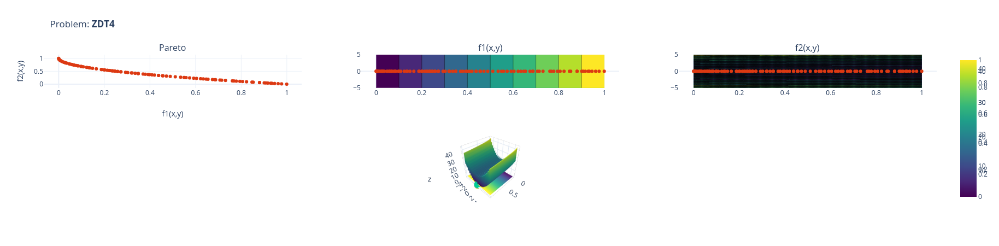

In [12]:
DIM = 2
ID = 4
OBJ = 2

# udp = pg.wfg(prob_id=ID, dim_dvs=DIM, dim_obj=OBJ, dim_k=OBJ-1)  # == WFG
udp = pg.zdt(prob_id=ID, param=DIM) # == ZDT
# udp = pg.dtlz(prob_id=4, dim=3, fdim=2) # == DTLZ
pro = pg.problem(udp)

pop = pg.population(pro, size=100)
algo = pg.algorithm(pg.nsga2(gen=100))
e_pop = algo.evolve(pop)      

fig = plot_mo(pro, e_pop, samples=200)
fig

___
## Table

In [ ]:
DIM = 2
ID = 6
OBJ = 2

# udp = pg.wfg(prob_id=ID, dim_dvs=DIM, dim_obj=OBJ, dim_k=OBJ-1)  # == WFG
udp = pg.zdt(prob_id=ID, param=DIM) # == ZDT
# udp = pg.dtlz(prob_id=4, dim=3, fdim=2) # == DTLZ
pro = pg.problem(udp)

# --- Hypermapper group_id
name = '{}_{}{}*.csv'.format(pro.get_name(), pro.get_nx(), pro.get_nobj())
folder = './data/hypermapper/concat/'
paths = glob.glob('{}{}'.format(folder, name))
df_map = pd.read_csv(paths[0]) if len(paths)==1 else 'uncertainty on file selection'
print('Repeats: ', len(df_map.group_id.unique()))

# --- MOEA group_id
moea_algo = 'nsga2'
name = '{}_on_{}_{}{}*.csv'.format(moea_algo, pro.get_name(), pro.get_nx(), pro.get_nobj())
folder = './data/moea/concat/'
paths = glob.glob('{}{}'.format(folder, name))
df_ea = pd.read_csv(paths[0]) if len(paths)==1 else 'uncertainty on file selection'
df_ea.rename(columns={"f_0": "f1", "f_1": "f2"}, inplace=True)
# # idx = df_ea[df_ea['i_fevals']=='i_fevals'].index
# df_ea.drop(idx, inplace=True)
df_ea['i_fevals'] = df_ea['i_fevals'] - 100
print('Repeats: ', len(df_ea.group_id.unique()))

# --- TutorM tutor_id
name = 'def_tutm_{}_{}{}*.pkl'.format(pro.get_name(), pro.get_nx(), pro.get_nobj())
folder = './data/tutorm/default_tutor/concat/'
paths = glob.glob('{}{}'.format(folder, name))
df_tut = pd.read_pickle(paths[0]) if len(paths)==1 else 'uncertainty on file selection'
print('Repeats: ', len(df_tut.tutor_id.unique()))

REPEATS = 5
INIT_SIZE = 100

groups = df_ea.group_id.unique()[:REPEATS]
idx = df_ea.group_id.isin(groups)
temp_df_ea = df_ea[idx]

moea_pops = []
for name, grp in temp_df_ea.query('i_fevals<=1000').groupby(['group_id']):
    moea_pops.append(grp[['f1', 'f2']].values)
    
moea_10k_pops = []
for name, grp in temp_df_ea.query('i_fevals<=10000').groupby(['group_id']):
    moea_10k_pops.append(grp[['f1', 'f2']].values)
    
map_pops = []
for name, grp in df_map.query('init_size==100').groupby(['group_id']):
    map_pops.append(grp[['f1', 'f2']].values)
    
tut_pops = []
for name, grp in df_tut.query('solution_comb=="stack"').groupby(['tutor_id']):
    tut_pops.append(grp.iloc[-1].pop_ndf_y)
    
all_pops = [np.concatenate(pops, axis=0) for pops in [moea_pops, map_pops, tut_pops]]
ref_point = np.amax(np.concatenate(all_pops, axis=0), axis=0).tolist()

print("Tutor: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in tut_pops]))
print("Hypermaper: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in map_pops]))
print("NSGA2: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in moea_pops]))
print("NSGA2 10k: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in moea_10k_pops]))
print("Random: ", pg.hypervolume(pg.population(pro, size=100).get_f()).compute(ref_point))


print(pro.get_name(), np.mean([get_space_m(pop[pg.non_dominated_front_2d(pop.tolist())]) for pop in map_pops]))

In [ ]:
# df_tut.query('solution_comb=="stack"').groupby(['tutor_id']).mean()

In [ ]:
REPEATS = 5
INIT_SIZE = 100

groups = df_ea.group_id.unique()[:REPEATS]
idx = df_ea.group_id.isin(groups)
temp_df_ea = df_ea[idx]

moea_pops = []
for name, grp in temp_df_ea.query('i_fevals<=1000').groupby(['group_id']):
    moea_pops.append(grp[['f1', 'f2']].values)
    
moea_10k_pops = []
for name, grp in temp_df_ea.query('i_fevals<=10000').groupby(['group_id']):
    moea_10k_pops.append(grp[['f1', 'f2']].values)
    
map_pops = []
for name, grp in df_map.query('init_size==100').groupby(['group_id']):
    map_pops.append(grp[['f1', 'f2']].values)
    
tut_pops = []
for name, grp in df_tut.query('solution_comb=="stack"').groupby(['tutor_id']):
    tut_pops.append(grp.iloc[-1].pop_ndf_y)

In [ ]:
# all_pops = [np.concatenate(pops, axis=0) for pops in [moea_pops, map_pops, tut_pops]]
# ref_point = np.amax(np.concatenate(all_pops, axis=0), axis=0).tolist()

In [ ]:
# print("Tutor: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in tut_pops]))
# print("Hypermaper: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in map_pops]))
# print("NSGA2: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in moea_pops]))
# print("NSGA2 10k: ", np.mean([pg.hypervolume(pop).compute(ref_point) for pop in moea_10k_pops]))

